# Import 목록

In [1]:
import numpy as np
import folium
import json
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point
from sklearn.cluster import KMeans

In [8]:
import warnings

warnings.filterwarnings(action='ignore')

# 제공된 데이터 목록

01.안양시_격자별인구현황(전체).geojson<br>
02.안양시_격자별인구현황(고령).geojson<br>
04.안양시_격자별인구현황(유소년).geojson<br>
05.안양시_월별_시간대별_유동인구.csv <b>(비공개 데이터)</b><br>
10.안양시_공장등록현황.csv<br>
13.안양시_버스정류장_위치정보.csv<br>
14.안양시_버스정류장별_이용객수.csv<br>
16.안양시_노드정보.csv<br>
18.안양시_교통량정보.csv <b>(비공개 데이터)</b><br>
24.안양시_행정경계(읍면동).geojson

# 인구현황 데이터 확인

In [2]:
인구현황 = gpd.read_file('datasets/01.안양시_격자별인구현황(전체).geojson')
인구현황

,gid,val,geometry
0,다사442343,NaN,"MULTIPOLYGON (((126.86950 37.40614, 126.86949 ..."
1,다사442344,NaN,"MULTIPOLYGON (((126.86949 37.40704, 126.86948 ..."
2,다사442345,NaN,"MULTIPOLYGON (((126.86948 37.40794, 126.86948 ..."
3,다사442347,NaN,"MULTIPOLYGON (((126.86947 37.40975, 126.86946 ..."
4,다사442348,NaN,"MULTIPOLYGON (((126.86946 37.41065, 126.86945 ..."
...,...,...,...
6112,다사541336,NaN,"MULTIPOLYGON (((126.98140 37.40038, 126.98139 ..."
6113,다사541337,NaN,"MULTIPOLYGON (((126.98139 37.40128, 126.98139 ..."
6114,다사542329,NaN,"MULTIPOLYGON (((126.98257 37.39407, 126.98257 ..."
6115,다사542335,NaN,"MULTIPOLYGON (((126.98254 37.39948, 126.98253 ..."


# 유동인구 데이터 확인

In [68]:
유동인구 = pd.read_csv('datasets/05.안양시_월별_시간대별_유동인구.csv')
유동인구

,STD_YM,TMST_00,TMST_01,TMST_02,TMST_03,TMST_04,TMST_05,TMST_06,TMST_07,TMST_08,...,TMST_16,TMST_17,TMST_18,TMST_19,TMST_20,TMST_21,TMST_22,TMST_23,lon,lat
0,201901,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.02,0.02,...,0.03,0.03,0.01,0.01,0.01,0.00,0.00,0.00,126.873809,37.409582
1,201901,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,126.874363,37.410937
2,201901,0.01,0.01,0.00,0.01,0.01,0.02,0.02,0.04,0.04,...,0.05,0.06,0.05,0.04,0.03,0.03,0.03,0.02,126.875519,37.407788
3,201901,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,126.876069,37.409594
4,201901,0.00,0.00,0.00,0.00,0.00,0.01,0.01,0.01,0.01,...,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,126.876062,37.410495
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
156278,201912,0.14,0.07,0.07,0.05,0.04,0.05,0.07,0.18,0.37,...,0.28,0.30,0.35,0.32,0.26,0.23,0.21,0.18,126.981221,37.400187
156279,201912,0.07,0.04,0.02,0.02,0.02,0.05,0.12,0.19,0.25,...,0.26,0.26,0.30,0.21,0.14,0.16,0.14,0.11,126.981212,37.401539
156280,201912,0.19,0.11,0.05,0.04,0.04,0.07,0.12,0.34,0.62,...,0.79,0.88,1.02,0.88,0.69,0.60,0.57,0.37,126.981824,37.394781
156281,201912,0.14,0.09,0.05,0.04,0.04,0.11,0.21,0.51,1.02,...,0.72,0.81,1.06,0.74,0.51,0.46,0.41,0.26,126.981821,37.395232


# 유동인구 데이터 가공

In [69]:
유동인구['sum'] = 유동인구.iloc[:, 1:24].sum(axis=1)
summary = 유동인구.loc[:, ['lon', 'lat', 'sum']]
summary

,lon,lat,sum
0,126.873809,37.409582,0.27
1,126.874363,37.410937,0.01
2,126.875519,37.407788,0.79
3,126.876069,37.409594,0.01
4,126.876062,37.410495,0.12
...,...,...,...
156278,126.981221,37.400187,4.73
156279,126.981212,37.401539,3.68
156280,126.981824,37.394781,10.95
156281,126.981821,37.395232,11.80


# 버스정류장 위치 데이터 확인

In [70]:
버정위치 = pd.read_csv('datasets/13.안양시_버스정류장_위치정보.csv')
버정위치list = 버정위치.values.tolist()
버정위치list

[['친목마을', 208000079, 126.88308329999998, 37.40921667],
 ['친목마을', 208000112, 126.8835, 37.4091],
 ['한양수자인아파트후문', 208000009, 126.92135, 37.40415],
 ['박달주유소', 208000168, 126.88535, 37.40423333],
 ['호현마을', 208000078, 126.8854, 37.40616667],
 ['호현삼거리', 208000167, 126.88661670000002, 37.4048],
 ['코카콜라물류센터', 208000169, 126.89053329999999, 37.40545],
 ['노루페인트.대림한숲아파트', 208000166, 126.89176670000002, 37.40481667],
 ['충훈고교', 208000193, 126.89173329999998, 37.41085],
 ['충훈고교', 208000196, 126.89200000000001, 37.41091667],
 ['노루페인트.대림한숲아파트', 208000056, 126.89308329999999, 37.4046],
 ['충훈부종점', 208000111, 126.89355, 37.4095],
 ['충훈부종점', 208000096, 126.8935167, 37.40938333],
 ['석수동버스공영차고지', 208000380, 126.89478329999999, 37.4194],
 ['청란공원', 208000110, 126.89471670000002, 37.40808333],
 ['석수동버스공영차고지', 208000381, 126.8948167, 37.41963333],
 ['충훈2교', 208000057, 126.89495, 37.40368333],
 ['청란공원', 208000097, 126.8951, 37.40791667],
 ['안양천생태이야기관', 208000194, 126.89558329999998, 37.41741667],
 ['안양천생태이야기관', 

# 버스정류장 위치 가공

In [71]:
버정위치_not_name = 버정위치.iloc[:,1:].values.tolist()
버정위치_not_name

[[208000079.0, 126.88308329999998, 37.40921667],
 [208000112.0, 126.8835, 37.4091],
 [208000009.0, 126.92135, 37.40415],
 [208000168.0, 126.88535, 37.40423333],
 [208000078.0, 126.8854, 37.40616667],
 [208000167.0, 126.88661670000002, 37.4048],
 [208000169.0, 126.89053329999999, 37.40545],
 [208000166.0, 126.89176670000002, 37.40481667],
 [208000193.0, 126.89173329999998, 37.41085],
 [208000196.0, 126.89200000000001, 37.41091667],
 [208000056.0, 126.89308329999999, 37.4046],
 [208000111.0, 126.89355, 37.4095],
 [208000096.0, 126.8935167, 37.40938333],
 [208000380.0, 126.89478329999999, 37.4194],
 [208000110.0, 126.89471670000002, 37.40808333],
 [208000381.0, 126.8948167, 37.41963333],
 [208000057.0, 126.89495, 37.40368333],
 [208000097.0, 126.8951, 37.40791667],
 [208000194.0, 126.89558329999998, 37.41741667],
 [208000195.0, 126.89578329999999, 37.41726667],
 [208000198.0, 126.89591670000001, 37.40528333],
 [208000109.0, 126.89603329999998, 37.4071],
 [208000165.0, 126.89613329999999, 

# 공장위치 데이터 확인

In [72]:
공장위치 = pd.read_csv('datasets/10.안양시_공장등록현황.csv')
공장위치list = 공장위치.values.tolist()
공장위치list

[['액체 펌프 제조업',
  29131.0,
  '소기업',
  '도시지역',
  '수중모터펌프',
  '해당없음',
  '해당없음',
  '유',
  0.0,
  0.0,
  126.97071399999999,
  37.388819],
 ['기타 인쇄업,오프셋 인쇄업',
  1811918113.0,
  '중기업',
  '도시지역',
  '인쇄물',
  '해당없음',
  '5종',
  '유',
  nan,
  23.0,
  126.89980600000001,
  37.431377000000005],
 ['비 및 솔 제조업',
  33993.0,
  '소기업',
  '도시지역',
  '화장용품,솔',
  '해당없음',
  '해당없음',
  '무',
  0.0,
  0.0,
  126.943008,
  37.38998],
 ['전자기 측정, 시험 및 분석기구 제조업',
  27212.0,
  '중기업',
  '도시지역',
  '인쇄기판검사기구',
  '해당없음',
  '해당없음',
  '유',
  12.0,
  0.0,
  126.944464,
  37.385182],
 ['안경 및 안경렌즈 제조업,광학렌즈 및 광학요소 제조업',
  2719327301.0,
  '소기업',
  '도시지역',
  '광학렌즈',
  '해당없음',
  '해당없음',
  '무',
  0.0,
  0.0,
  126.97535900000001,
  37.396014],
 ['물질 검사, 측정 및 분석기구 제조업,기타 주변기기 제조업,산업용 섬유 세척, 염색, 정리 및 가공 기계 제조업,그 외 기타 특수목적용 기계 제조업',
  2.72e+19,
  '소기업',
  '도시지역',
  '자동차검사장비,출입통제시스템',
  '해당없음',
  '해당없음',
  '무',
  0.0,
  0.0,
  126.93358899999998,
  37.387679],
 ['주형 및 금형 제조업',
  29294.0,
  '소기업',
  '도시지역',
  '프라스틱금형',
  '해당없음',
  '해당없음'

# 버스이용고객수 가공

##### 버스 이용 고객수를 우리가 이용할수 있는 형태로 변환
##### 이 과정이 매우 오래 걸리므로 이과정을 다 완수한 파일인 'bus_inout.csv' 을 실행하면 됨.

```python
busStop = pd.read_csv('datasets/13.안양시_버스정류장_위치정보.csv')
sid = busStop['STATION_ID']

def find(lst, key, value):
    for i, dic in enumerate(lst):
        if dic[key] == value:
            return i
    return -1

df = pd.read_csv('datasets/14.안양시_버스정류장별_이용객수.csv')
df

date_list = np.array(list(set(df['일자'])))
station_list = np.array([{'sid': i, 'in': [[] for i in range(len(date_list))], 'out': [[] for i in range(len(date_list))]} for i in sid])
result = []

for date in date_list:
    i = 0
    tmp = df[df['일자'] == date]
    for idx in tmp.index:
        sid = df._get_value(idx, '정류소ID')
        station_list[find(station_list, 'sid', sid)]['in'][i].append(df._get_value(idx, '전체 승차 건수'))
        station_list[find(station_list, 'sid', sid)]['out'][i].append(df._get_value(idx, '전체 하차 건수'))
    i += 1
    
for station in station_list:
    in_sum = 0
    out_sum = 0
    
    for i in range(len(station['in'])):
        emp_cnt = 0
        if not station['in'][i]:
            emp_cnt += 1
        else:
            in_sum += sum(station['in'][i])
            out_sum += sum(station['out'][i])
    
    in_mean = in_sum / (len(station['in']) - emp_cnt)
    out_mean = out_sum / (len(station['in']) - emp_cnt)
    result.append({'sid': station['sid'], 'in': in_mean, 'out': out_mean})
    
BusStop = pd.DataFrame(result)
BusStop.to_csv('datasets/bus_inout.csv')
```

In [73]:
bus_df = pd.read_csv('datasets/bus_inout.csv').iloc[:,1:]
bus_df

,sid,in,out
0,208000079,91.626039,75.210526
1,208000112,97.324100,112.002770
2,208000009,0.919668,31.265928
3,208000168,66.670360,80.570637
4,208000078,88.645429,176.257618
...,...,...,...
700,208506900,6.044321,0.063712
701,208507230,1.648199,4.387812
702,208508330,73.770083,34.102493
703,209508810,0.185596,1.036011


# 대기오염 파라미터 호출 및 가공

In [74]:
fac = pd.read_csv('datasets/10.안양시_공장등록현황.csv')
airpol= fac[['대기오염','lon','lat']]
# 대기오염 배출원양에 따른 차등 점수 부여
# 1종이 제일 배출량이 많아 가장 높은 점수 부여 
for i in range(len(airpol)):
    if (airpol.iloc[i][0] == '해당없음'):
        airpol.iloc[i,0] = 0
    else:
        if (airpol.iloc[i][0]== '5종'):
            airpol.iloc[i,0] = 1
        elif (airpol.iloc[i][0]== '4종'):
            airpol.iloc[i,0] = 2
        elif (airpol.iloc[i][0]== '3종'):
            airpol.iloc[i,0] = 3
        elif (airpol.iloc[i][0]== '2종'):
            airpol.iloc[i,0] = 4
        elif (airpol.iloc[i][0]== '1종'):
            airpol.iloc[i,0] = 5

# 대기오염원을 배출하지 않는 공장에 대한 행 제거 
index = airpol[(airpol['대기오염']==0)].index
airpolution = airpol.drop(index)
airpolution

,대기오염,lon,lat
247,1,126.940005,37.387539
356,1,126.947304,37.382351
358,1,126.970411,37.400260
572,1,126.970228,37.398727
577,2,126.942057,37.388575
583,1,126.970226,37.393122
587,1,126.936181,37.383990
684,1,126.886132,37.406335
697,1,126.950668,37.371919
782,1,126.938988,37.384322


# 행정경계 데이터 확인

In [75]:
행정경계=gpd.read_file('datasets/24.안양시_행정경계(읍면동).geojson').values.tolist()
행정경계

[['3104151',
  '안양1동',
 ['3104152',
  '안양2동',
 ['3104153',
  '안양3동',
 ['3104154',
  '안양4동',
 ['3104155',
  '안양5동',
 ['3104156',
  '안양6동',
 ['3104157',
  '안양7동',
 ['3104158',
  '안양8동',
 ['3104159',
  '안양9동',
 ['3104160',
  '석수1동',
 ['3104161',
  '석수2동',
 ['3104162',
  '석수3동',
 ['3104163',
  '박달1동',
 ['3104164',
  '박달2동',
 ['3104251',
  '비산1동',
 ['3104252',
  '비산2동',
 ['3104253',
  '비산3동',
 ['3104254',
  '부흥동',
 ['3104255',
  '달안동',
 ['3104256',
  '관양1동',
 ['3104257',
  '관양2동',
 ['3104258',
  '부림동',
 ['3104259',
  '평촌동',
 ['3104260',
  '평안동',
 ['3104261',
  '귀인동',
 ['3104262',
  '호계1동',
 ['3104263',
  '호계2동',
 ['3104264',
  '호계3동',
 ['3104265',
  '범계동',
 ['3104266',
  '신촌동',
 ['3104267',
  '갈산동',

# 행정경계 리스트 가공

In [76]:
행정경계_=gpd.read_file('datasets/24.안양시_행정경계(읍면동).geojson')
행정경계_list = list(행정경계_['ADM_DR_NM'])
행정경계_list

['안양1동',
 '안양2동',
 '안양3동',
 '안양4동',
 '안양5동',
 '안양6동',
 '안양7동',
 '안양8동',
 '안양9동',
 '석수1동',
 '석수2동',
 '석수3동',
 '박달1동',
 '박달2동',
 '비산1동',
 '비산2동',
 '비산3동',
 '부흥동',
 '달안동',
 '관양1동',
 '관양2동',
 '부림동',
 '평촌동',
 '평안동',
 '귀인동',
 '호계1동',
 '호계2동',
 '호계3동',
 '범계동',
 '신촌동',
 '갈산동']

# Grid class 정의
##### 주어진 데이터를 보면 지리정보가 대부분이며 그 지리정보와 함께 인구데이터, 시설 데이터 등이 주어져있다.
##### 주어진 데이터들을 하나의 단위로 묶기 위해서 Grid 라는 class를 정의하여 정보들을 하나로 묶는 작업을 한다.

In [77]:
class Grid:
    def __init__(self, _lon=0,_lat=0, _Population = 0, _FloatingPopulation = 0,_PrimaryKey=0,_evening_FP=0,_is_Anyang=0):
        self.All_score=0     # 생활인구를 나타내기 위한 지표로 pop_score+fpop_score_+bus_score 
        self.pop_score=0     # 거주인구를 나타내는 변수 : Population 변수를 4분위로 나누어서 점수를 부여
        self.fpop_score=0     # 유동인구를 나타내는 변수 : FloatingPopulation 변수를 4분위로 나누어서 점수를 부여
        self.bus_score=0     #버스 이용객 수를 나타내는 변수 : inout 변수를 4분위로 나누어서 점수를 부여
        self.Dong=''     # 해당 격자가 속해있는 동의 이름
        self.Bus_Station=[]     #해당 격자 내에 버스정류장
        self.inout=0     # 해당 격자 내에 버스 이용객 수를 나타내는 변수
        self.Factory=[]     # 해당 격자 내에 있는 공장
        self.is_Anyang=_is_Anyang     # Grid_class를 만들때 경계에 있는 격자를 처리하기 위한 변수
        self.PrimaryKey=_PrimaryKey     # Grid 객체마다 고유의 숫자를 부여하여 중복을 피함
        self.Lon=_lon      #Longitude , x , 경도
        self.Lat=_lat      #Latitude , y , 위도
        self.Population = _Population # 거주인구수
        self.FloatingPopulation=_FloatingPopulation #유동인구수 리스트를 평균내서 구함
        self.airpolution_score=0
        self.FloatingPopulation_list = [] #유동인구수 리스트
        self.old_people=0
        self.youth=0
    
    # 프린트함수
    def __str__(self):
        return "우선순위 : {}\n주소 : 경기도 안양시 {}\n경도,위도 :({},{})\n비고 : {}.".format(self.Dong,self.Dong,self.Lon,self.Lat,self.Dong)
    
    # 등위 연산자 정의
    def __eq__(self,G):
        if (self.Lon==G.Lon) and (self.Lat==G.Lat):
            return True
        else:
            return False
    

# Grid_list 만드는 셀
##### 안양시 지도에서 위도 경도의 최소,최대값을 구하여 먼저 정사각형의 격자를 만든다.

In [78]:
x_min,y_min = 126869, 37358
x_max,y_max = 126983, 37450
not_anyang=[]     #후에 안양시 경계에 놓여있는 격자를 처리하기 위한 변수
Grid_list=[]     # 안양시 지도를 일정 단위로 나누어 저장한 Grid 들을 담고있는 list
count=0     # PrimaryKey를 부여하기위해 놓은 변수

# 격자를 먼저 만들어놓고 추후에 값들을 넣고 필요없는 격자를 빼는 식으로 한다.
for i in range(y_min,y_max):
    for j in range(x_min,x_max):
        temp=Grid(j/1000,i/1000,_Population=0,_FloatingPopulation=0,_PrimaryKey=count)
        Grid_list.append(temp)
        count+=1

# Population 관련함수

In [79]:
# Population 함수
# 해당 위도 경도에 맞는 격자를 찾아서 반환
def Search_index(temp):
    # input = [위도,경도]
    grid=Grid(_floor(temp[0]),_floor(temp[1]))
    try :
        # 위도 경도로 검색한 격자가 있을 경우 해당 인덱스를 반환
        result = Grid_list.index(grid)
        return result
    except :
        # 위도 경도로 검색한 격자가 없을 경우 -1을 리턴
        return -1

# grid.Population 의 변수에 인구수를 더해줌
def P_Grid(temp):
    index = Search_index(temp)
    Grid_list[index].Population+=temp[2]
    Grid_list[index].is_Anyang+=1
    return

def older_Grid(temp):
    index = Search_index(temp)
    Grid_list[index].old_people+=temp[2]
    Grid_list[index].is_Anyang+=1
    return

def youth_Grid(temp):
    index = Search_index(temp)
    Grid_list[index].youth+=temp[2]
    Grid_list[index].is_Anyang+=1
    return

# Grid_list에 있는 모든 grid에 인구수를 전부 더해줌
def input_Population(temp):
    for i in range(len(temp)):
        P_Grid(temp[i])
        
def input_older(temp):
    for i in range(len(temp)):
        older_Grid(temp[i])
        
def input_youth(temp):
    for i in range(len(temp)):
        youth_Grid(temp[i])


# FloatingPopulaion 함수

In [80]:
# FloatingPopulation 함수
# FloatingPopulation_list 에 하나식 더해줌
def FP_Grid(temp):
    index = Search_index(temp)
    Grid_list[index].FloatingPopulation_list.append(temp[2])
    Grid_list[index].is_Anyang+=1


# FloatingPopulation_list에서 평균을 계산하여 FloatingPopulation에 넣어줌
# FloatingPopulation 자료가 월별로 되어있기 떄문
def update_FP():
    i_list=[]
    for i in Grid_list:
        if i.is_Anyang==0:
            i_list.append(i)
        try :
            i.FloatingPopulation = sum(i.FloatingPopulation_list) / len(i.FloatingPopulation_list)
            
        except :
            #유동인구가 0 일경우
            i.FloatingPopulation=0
    for j in i_list:
        not_anyang.append(j)
        delete_grid(j)
    for k in not_anyang:
        if between_true(k):
            index = Search_index([k.Lon,k.Lat])
            Grid_list.insert(index+1,k)
        
#Grid_list 에 FP를 넣어줌
def input_FPopulation(temp):
    for i in range(len(temp)):
        FP_Grid(temp[i])
    update_FP()


# Bus_Stop 함수

In [81]:
# 위도 경도를 통해서 해당 버스정류장 id를 가진 grid를 반환
def Search_index_bus(temp):
    grid=Grid(_floor(temp[2]),_floor(temp[3]))
    try :
        result = Grid_list.index(grid)
        return result
    except :
        return -1
    
# 모든 Grid_list에 버스 정류장 정보를 더해줌
def Bus_Station_Add(temp):
    #temp=[버정이름,id,lon,lat]가 담긴 리스트
    for i in temp:
        index = Search_index_bus(i)
        Grid_list[index].Bus_Station.append(i)

# Factory 함수

In [82]:
# 위도 경도를 통해서 해당 공장 위치 인덱스를 찾음
def Search_index_factory(temp):
    grid=Grid(_floor(temp[10]),_floor(temp[11]))
    try :
        result = Grid_list.index(grid)
        return result
    except :
        return -1

#모든 공장 정보를 Grid_list에 더해줌
def Factory_Add(temp):
    for i in temp:
        index = Search_index_factory(i)
        Grid_list[index].Factory.append(i)

# Bus 유동인구 함수

In [83]:
#inout_score : 버스에서 타고 내리는 인원수를 더한 값으로 유동인구 정보로 활용한다.
#inout 점수를 grid에 부여한다
def add_inout_score(temp):
    inout_score=0
    bus_id = bus_df[bus_df['sid']==temp[0]].values.tolist()[0][0]
    inout_score = bus_df[bus_df['sid']==temp[0]].values.tolist()[0][1]+bus_df[bus_df['sid']==temp[0]].values.tolist()[0][2]
    lon = _floor(버정위치[버정위치['STATION_ID']==bus_id].values.tolist()[0][2])
    lat = _floor(버정위치[버정위치['STATION_ID']==bus_id].values.tolist()[0][3])
    index = Search_index([lon,lat])
    Grid_list[index].inout=inout_score
    return

# 모든 grid에 inout점수를 부여한다.
def all_add_inout_score(temp):
    for i in temp:
        add_inout_score(i)
    return

# 그 외의 함수

In [84]:
### 그 외의 함수
### 위도 경도를 소수점 3자리 까지 가공해주는 함수
def _floor(temp):
    result = int(temp*1000)/1000
    return result

#해당 격자를 제거한다.
def delete_grid(temp):
    val=[temp.Lon,temp.Lat]
    index = Search_index(val)
    del Grid_list[index]

#격자 정보를 json파일에 저장하기 위하여 변수들의 특성을 dictionary 형식으로 변환한다.
def make_feature(temp):
    lon = temp.Lon
    lat = temp.Lat
    a,b,c,d=[],[],[],[]
    a=[lon,lat]
    b=[lon, lat+0.001]
    c=[lon+0.001,lat+0.001]
    d=[lon+0.001,lat]
    coordinate=[[[a,b,c,d,a]]]
    geometry={
        'type':"MultiPolygon",
        "coordinates":coordinate,
    }
    properties={
        "PrimaryKey" : temp.PrimaryKey,
        "Population":temp.Population,
        "FloatingPopulation" : temp.FloatingPopulation,
        "busstop_count" : len(temp.Bus_Station),
        "factory_count" : len(temp.Factory),
        'bus_inout' : temp.inout,
        "All_score" : int(str(temp.All_score[0])),
        'old_people' : temp.old_people,
        'youth' : temp.youth,
    }
    return {"type" : "Feature","properties":properties,"geometry":geometry}

# 모든 격자에 대하여 make_feature을 실행한다.
def make_features(temp):
    result=[]
    for i in Grid_list:
        result.append(make_feature(i))
    return result


# geojson파일을 만들기 위한 가공
def make_json(temp):
    values=make_features(temp)
    result={
        "type":'FeatureCollection',
        "name":'18',
        "crs": { "type": "name", "properties": { "name": "urn:ogc:def:crs:OGC:1.3:CRS84" } },
        'features':values
    }
    return result

# grid의 위치를 정확히 찾기위한 부가함수
def between_true(grid):
    L=Grid(grid.Lon-0.001,grid.Lat,_PrimaryKey=grid.PrimaryKey-1)
    R=Grid(grid.Lon+0.001,grid.Lat,_PrimaryKey=grid.PrimaryKey+1)
    if find_pk(L)!=-1 and find_pk(R)!=-1:
        return True
    else :
        return False

# PrimaryKey를 기준으로 grid를 찾는다.
def find_pk(grid):
    for i in Grid_list:
        if i.PrimaryKey==grid.PrimaryKey:
            return i.PrimaryKey
    return -1

#geojson파일을 저장한다.
def save_json():
    import json
    file_path="./Grid.geojson"
    result = make_json(Grid_list)
    
    with open(file_path,'w') as outfile:
        json.dump(result,outfile)
        
    return 

def save_json_final():
    import json
    file_path="./Final_Map.geojson"
    result = make_json(Grid_list)
    
    with open(file_path,'w') as outfile:
        json.dump(result,outfile)
        
    return 

# grid를 point 형식으로 변환한다.
def grid_to_point(grid):
    x = grid.Lon
    y = grid.Lat
    return Point(x,y)

# grid가 해당 multipolygon에 있는지 검사한다.
def is_in_multipolygon(grid):
    point = grid_to_point(grid)
    for m in 행정경계:
        if point.within(m[2]):
            return m

# Grid_list에 동에 관한 정보를 더한다.
def input_Dong(grid_list):
    temp_list=[]
    for grid in grid_list:
        try:
            dong = is_in_multipolygon(grid)[1]
            grid.Dong = dong
        except:
            temp_list.append(grid)
    for temp in temp_list:
        grid_list.remove(temp)
    return


# grid_list를 만든다
# 사분위값과 중간값을 추출하고 all score를 만들기 위함
def make_grid_df(grid_list):
    cols=['PrimaryKey','Dong','inout','Population','FloatingPopulation','old_people','youth','Lon','Lat']
    vals=[]
    for i in Grid_list:
        value=[i.PrimaryKey,i.Dong,i.inout,i.Population,i.FloatingPopulation,i.old_people,i.youth,i.Lon,i.Lat]
        vals.append(value)
    return pd.DataFrame(vals,columns=cols)


# grid_list를 만든다
# 사분위값과 중간값을 추출하고 all score를 만들기 위함
def add_grid_df(grid_list):
    import numpy as np
    dataframe = make_grid_df(grid_list)
    all_score=[]
    bus_score=[]
    pop_score=[]
    fpop_score=[]
    for k in range(len(dataframe)):
        i=dataframe.iloc[k][2]
        p=dataframe.iloc[k][3]
        f=dataframe.iloc[k][4]
        if i<q1[0]:
            bus_score.append(1)
        elif q1[0]<=i<m[0]:
            bus_score.append(2)
        elif m[0]<=i<q3[0]:
            bus_score.append(3)
        else:
            bus_score.append(4)
            
        if p<q1[1]:
            pop_score.append(1)
        elif q1[1]<=p<m[1]:
            pop_score.append(2)
        elif m[1]<=p<q3[1]:
            pop_score.append(3)
        else:
            pop_score.append(4)
            
        if f<q1[2]:
            fpop_score.append(1)
        elif q1[2]<=f<m[2]:
            fpop_score.append(2)
        elif m[2]<=f<q3[2]:
            fpop_score.append(3)
        else:
            fpop_score.append(4)
    dataframe['fpop_score']=np.array(fpop_score)
    dataframe['pop_score']=np.array(pop_score)
    dataframe['bus_score']=np.array(bus_score)
    dataframe['All_score']=np.array(bus_score)+np.array(pop_score)+np.array(fpop_score)
    return dataframe

#grid를 KMeans 를 활용하기 위해 numpy 배열 형태로 변환한다.
def grid_to_array(grid):
    lon=grid.Lon
    lat=grid.Lat
    all_score = grid.All_score
    return np.array([lon,lat,all_score])

def add_airpolution_score(df):
    temp = df.values.tolist()
    for i in temp:
        lon=float(str(i[1]))
        lat=float(str(i[2]))
        index = Search_index([lon,lat])
        if index==-1:
            continue
        Grid_list[index].airpolution_score+=int(i[0])

# 격자별 전체 인구현황 데이터 가져오기

In [85]:
pop_data = gpd.read_file('datasets/01.안양시_격자별인구현황(전체).geojson')
lat = []
lon = []
val = []
for geo in pop_data['geometry']:
    x,y = geo[0].exterior.xy
    lon.append(x[0])
    lat.append(y[0])
for pop in pop_data['val']:
    val.append(pop)
lo_info = pd.DataFrame({'lon': lon, 'lat':lat, 'val':val})
lo_info.fillna(0,inplace=True)
lo_list = []
for i in range(len(lo_info)):
    info = lo_info.iloc[i].tolist()
    lo_list.append(info)

In [86]:
input_Population(lo_list)

# 격자별 노인 인구현황 데이터 가져오기

In [87]:
pop_data = gpd.read_file('datasets/02.안양시_격자별인구현황(고령).geojson')
lat = []
lon = []
val = []
for geo in pop_data['geometry']:
    x,y = geo[0].exterior.xy
    lon.append(x[0])
    lat.append(y[0])
for pop in pop_data['val']:
    val.append(pop)
lo_info = pd.DataFrame({'lon': lon, 'lat':lat, 'val':val})
lo_info.fillna(0,inplace=True)
lo_list = []
for i in range(len(lo_info)):
    info = lo_info.iloc[i].tolist()
    lo_list.append(info)

In [88]:
input_older(lo_list)

# 격자별 유소년 인구현황 데이터 가져오기

In [89]:
pop_data = gpd.read_file('datasets/04.안양시_격자별인구현황(유소년).geojson')
lat = []
lon = []
val = []
for geo in pop_data['geometry']:
    x,y = geo[0].exterior.xy
    lon.append(x[0])
    lat.append(y[0])
for pop in pop_data['val']:
    val.append(pop)
lo_info = pd.DataFrame({'lon': lon, 'lat':lat, 'val':val})
lo_info.fillna(0,inplace=True)
lo_list = []
for i in range(len(lo_info)):
    info = lo_info.iloc[i].tolist()
    lo_list.append(info)

In [90]:
input_youth(lo_list)

# Bus 데이터 인풋

In [91]:
Bus_Station_Add(버정위치list)

# Factory 데이터 인풋

In [92]:
Factory_Add(공장위치list)

### FloatingPopulation 데이터 넣는함수 실행

**(아래 코드는는 비공개 데이터를 이용하여 부득이하게 주석처리 진행)**

In [93]:
input_FPopulation(summary.values.tolist())

# bus 유동인구 실행

In [94]:
all_add_inout_score(버정위치_not_name)

# Input_Dong 실행

In [95]:
input_Dong(Grid_list)

# 대기오염점수

In [96]:
add_airpolution_score(airpolution)

# Dong_dict 생성

In [97]:
Dong_dict={}
for i in 행정경계_list:
    Dong_dict[i]=[]
for grid in Grid_list:
    Dong_dict[grid.Dong].append(grid)

# 4분위 값과 중간값을 만든다

In [98]:
df=make_grid_df(Grid_list).describe()
df

,PrimaryKey,inout,Population,FloatingPopulation,old_people,youth,Lon,Lat
count,5912.000000,5912.000000,5912.000000,5912.000000,5912.000000,5912.000000,5912.000000,5912.000000
mean,5141.273173,61.218093,93.298545,111.663222,14.103687,9.538058,126.927805,37.402583
std,2225.150376,405.227627,227.619205,265.787543,33.782354,28.288378,0.026242,0.019503
min,145.000000,0.000000,0.000000,0.000000,0.000000,0.000000,126.871000,37.359000
25%,3391.750000,0.000000,0.000000,0.000000,0.000000,0.000000,126.905000,37.387000
50%,5049.500000,0.000000,0.000000,16.001660,0.000000,0.000000,126.928000,37.402000
75%,6817.250000,0.000000,12.000000,119.187224,0.000000,0.000000,126.951000,37.417000
max,10320.000000,9513.429363,2569.000000,5195.244792,456.000000,361.000000,126.982000,37.448000


In [99]:
df=make_grid_df(Grid_list).describe()
q1 = df.iloc[4][['inout','Population','FloatingPopulation']]
m = df.iloc[5][['inout','Population','FloatingPopulation']]
q3 = df.iloc[6][['inout','Population','FloatingPopulation']]
grid_df= add_grid_df(Grid_list)

# Grid_list에 All_score 더함

In [100]:
for grid in Grid_list:
    grid.All_score = grid_df[grid_df['PrimaryKey']==grid.PrimaryKey]['All_score'].values
    grid.bus_score = grid_df[grid_df['PrimaryKey']==grid.PrimaryKey]['bus_score']
    grid.pop_score = grid_df[grid_df['PrimaryKey']==grid.PrimaryKey]['pop_score']
    grid.fpop_score = grid_df[grid_df['PrimaryKey']==grid.PrimaryKey]['fpop_score']

### JSON파일 저장셀

In [101]:
save_json()

# KMeans 비지도학습을 위한 사전 데이터 학습
##### 각 동마다 적절한 수의 복합센서를 설치하기 위해  동 마다  Elbow method를 활용하여 최적의 cluster 개수를 찾는다
##### cluster 개수에 따른 inertia 의 수치를 plot 하여 시각화한다.
##### 격자마다 All_score 라는 변수를 부여했고 해당 변수는 거주인구와 유동인구의 수를 나타내는 파라미터로 활용한다.
##### 임계값을 최대 12까지 줄 수 있고 그 임계값 이상의 값을 가지는 격자를 활용하여 적절한 cluster개수를 찾는다

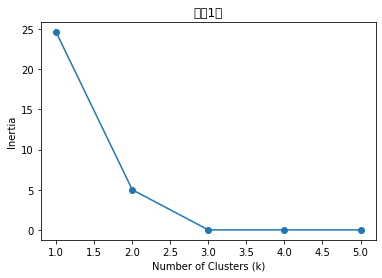

안양1동


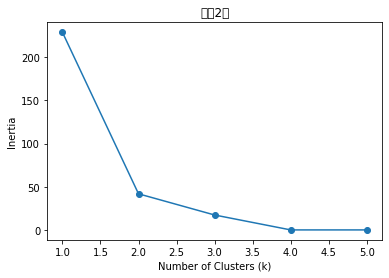

안양2동


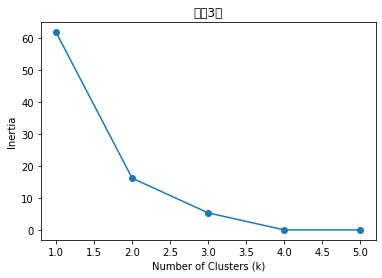

안양3동


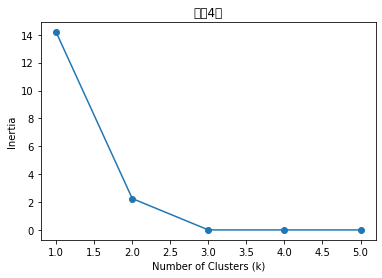

안양4동


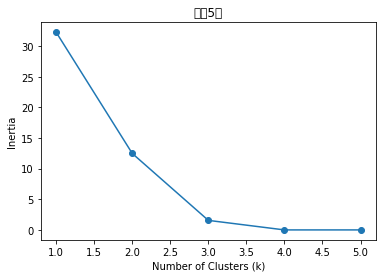

안양5동


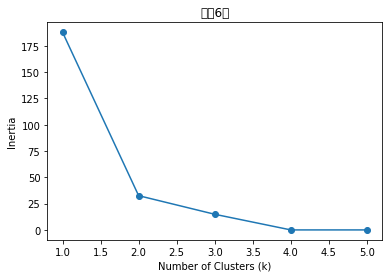

안양6동


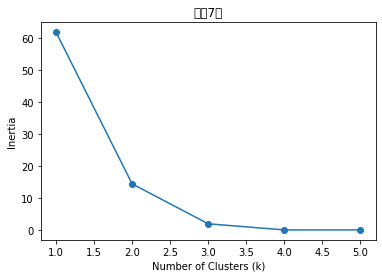

안양7동


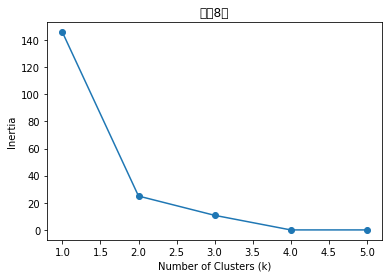

안양8동


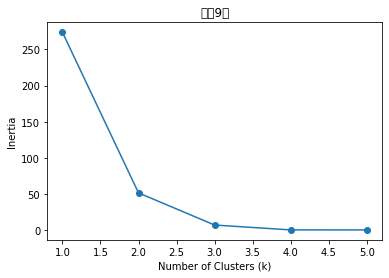

안양9동


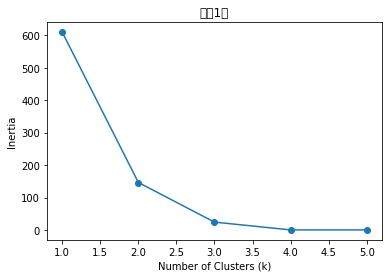

석수1동


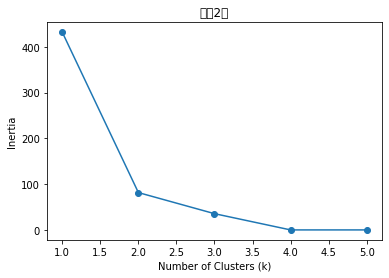

석수2동


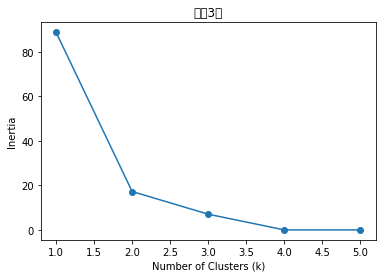

석수3동


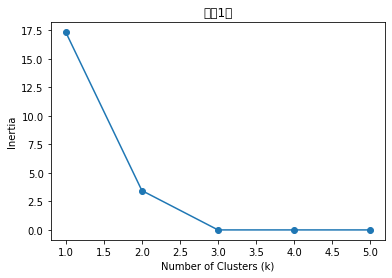

박달1동


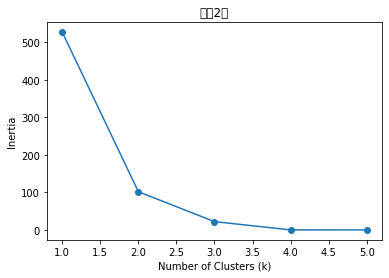

박달2동


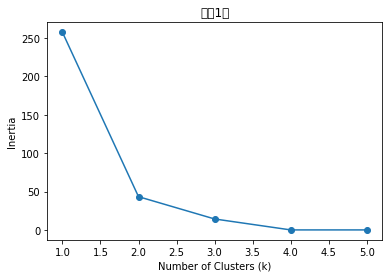

비산1동


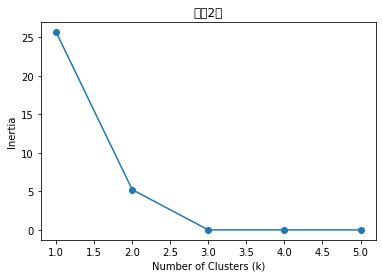

비산2동


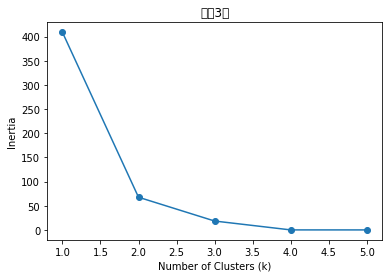

비산3동


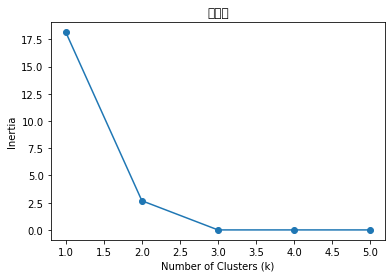

부흥동


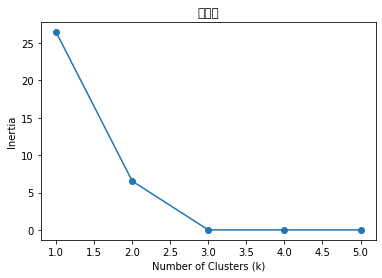

달안동


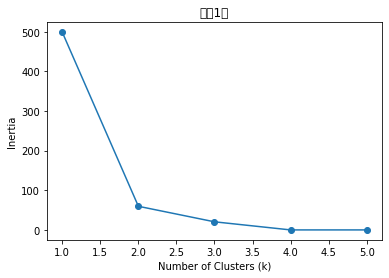

관양1동


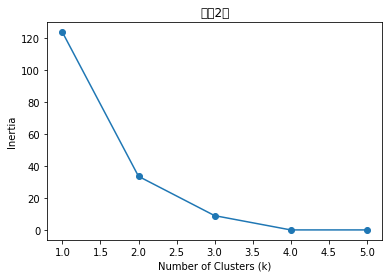

관양2동


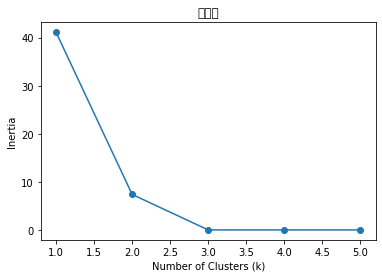

부림동


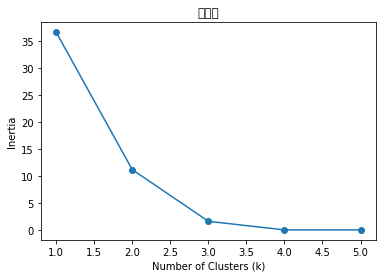

평촌동


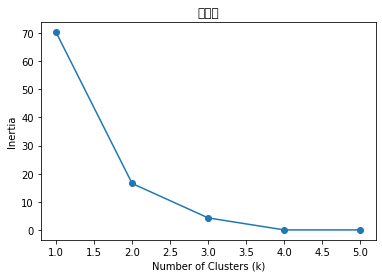

평안동


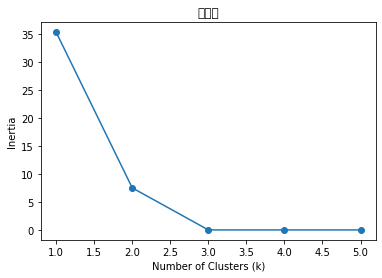

귀인동


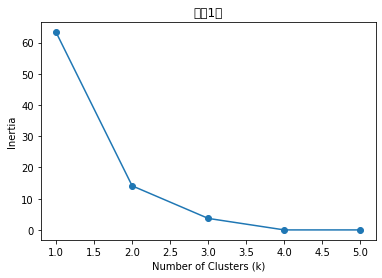

호계1동


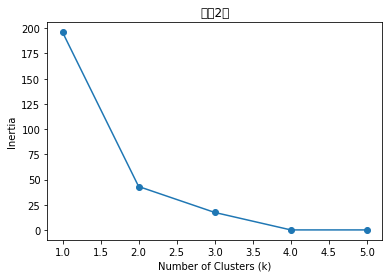

호계2동


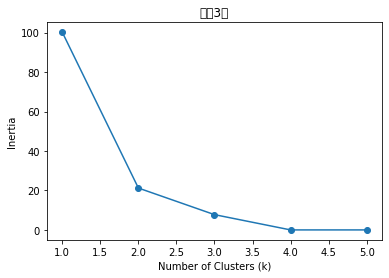

호계3동


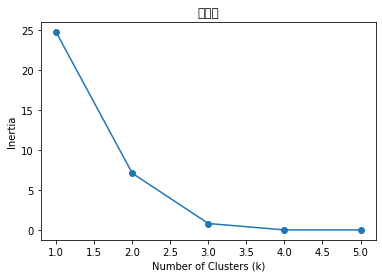

범계동


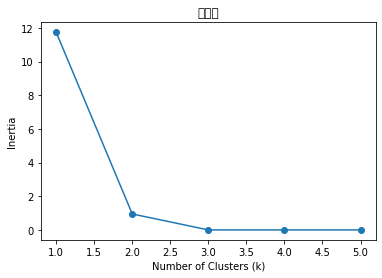

신촌동


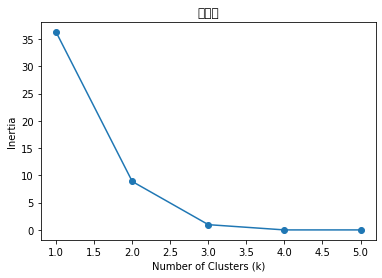

갈산동


'\n그래프의 결과를 보면 박달1동, 관양2동 의 경우 elbow의 위치로 보아 클러스터의 개수가 3개로 적절하고\n그 외의 그래프는 2개가 적절하다. 그러므로 위의 두 지역에는 3개, 그 외의 지역에는 2개식 고르게 우선적으로 배치한다.\n'

In [108]:
for k in Dong_dict:
    data_list=[]     #KMeans에 활용할 데이터를 모아두는 list
    for i in Dong_dict[k]:     # 각 동을 모아둔 dictionary
        if grid_to_array(i)[2]>=8:
            data_list.append(grid_to_array(i))
    num_clusters=list(range(1,6))
    inertias=[]
    for j in num_clusters:
        model=KMeans(n_clusters=j)
        model.fit(data_list)
        inertias.append(model.inertia_)
    plt.plot(num_clusters, inertias, '-o')
    plt.xlabel('Number of Clusters (k)')
    plt.ylabel('Inertia')
    plt.title(k)
    plt.show()
    print(k)
"""
그래프의 결과를 보면 박달1동, 관양2동 의 경우 elbow의 위치로 보아 클러스터의 개수가 3개로 적절하고
그 외의 그래프는 2개가 적절하다. 그러므로 위의 두 지역에는 3개, 그 외의 지역에는 2개식 고르게 우선적으로 배치한다.
"""

In [109]:
center_list=[]     # 각 cluster의 중심 위치를 담을 list
for k in Dong_dict:      # 각 동을 모아둔 dictionary
    num_clusters=2
    if k in ['박달1동','관양2동']:     #위으 결과에서 박달1동과,관양2동은 3개의 클러스터가 적절하므로 해당 동만 3개로 설정
        num_clusters=3
        
    kmeans_list=[]     # 고려할 격자들을 모아두는 list
    for l in Dong_dict[k]:
        if grid_to_array(l)[2]>=12:     # 임계값은 12가 최대값이고 해당 값으로 cluster을 찾아야 가장 인구 밀도가 높은 점을 위주로 찾기에 여기서는 12로 설정
            kmeans_list.append(grid_to_array(l))
    model=KMeans(n_clusters=num_clusters, n_init=100,max_iter=30000,tol=0.000001)
    model.fit(kmeans_list)
    center_list.append(model.cluster_centers_)
    

# KMeans를 통해 구한 좌표들을 지도에 시각화 한다.

In [110]:
center = (37.403109, 126.932585); zoom = 13
# 배경 지도 설정
m = folium.Map(location=center,
           zoom_start=zoom,
           tiles='http://api.vworld.kr/req/wmts/1.0.0/80F9E6B6-38BE-3770-AA9B-2C9ADEDD0458/Base/{z}/{y}/{x}.png',
           attr='안양시'
              )
grid_data = gpd.read_file('Grid.geojson') # 격자별 데이터셋

m.choropleth(
    geo_data=grid_data,
    data=grid_data,
    columns=['PrimaryKey', 'All_score'],
    key_on='feature.properties.PrimaryKey',
    fill_color='BuPu',
    fill_opacity=0.5,
    line_opacity=0.5,
    color = 'gray',
    legend_name = 'All_score'
)
# 행정경계 선 추가
rfile = open('datasets/24.안양시_행정경계(읍면동).geojson', 'rt', encoding='UTF8').read()
jsonData = json.loads(rfile)
folium.GeoJson(jsonData, name='json_data').add_to(m)

# kmeans를 통한 결과 좌표 추가
for row in center_list:
    folium.Marker([row[0][1], row[0][0]]).add_to(m)
    folium.Marker([row[1][1], row[1][0]]).add_to(m)
    try:
        folium.Marker([row[2][1], row[2][0]]).add_to(m)
    except:
        continue
folium.LayerControl().add_to(m)

m

# 그 외의 16개의 복합센서

##### 복합센서를 통해서 각 지역의 폭염 및 온열지수를 산출하여 노인 및 유소년 등 취약 계층을 위한 정책 근거로 활용 가능

##### 각각 유소년인구분포, 노인 인구분포를 고려하여 가장 많은 지역 8개를 선정하여 그곳의 격자에 설치한다

In [111]:
def old():
    result=[]
    for i in range(8):
        old_data = grid_df.sort_values(['old_people'],ascending=[False]).iloc[:8]
        x,y = old_data.iloc[i]['Lon'],old_data.iloc[i]['Lat']
        index=Search_index([x,y])
        result.append(index)
    return result

def young():
    result=[]
    for i in range(8):
        old_data = grid_df.sort_values(['youth'],ascending=[False]).iloc[:8]
        x,y = old_data.iloc[i]['Lon'],old_data.iloc[i]['Lat']
        index=Search_index([x,y])
        result.append(index)
    return result

olist = old()
ylist = young()


# 복합센서 최종 설치지역

In [112]:
empty_values=[]
for row in center_list:
    if len(row)==2:
        index_1 = Search_index([row[0][0],row[0][1]])
        index_2 = Search_index([row[1][0],row[1][1]])
        empty_values.append(index_1)
        empty_values.append(index_2)
    else :
        index_1 = Search_index([row[0][0],row[0][1]])
        index_2 = Search_index([row[1][0],row[1][1]])
        index_3 = Search_index([row[2][0],row[2][1]])
        empty_values.append(index_1)
        empty_values.append(index_2)
        empty_values.append(index_3)
        
        
values = empty_values+olist+ylist

last_grid_list=[]
for i in values:
    grid = Grid_list[i]
    last_grid_list.append(grid)
구_list=['안양1동','안양2동','안양3동','안양4동','안양5동','안양6동','안양7동','안양8동','안양9동','석수1동','석수2동','석수3동','박달1동','박달2동']
df_list=[]
for j in last_grid_list:
    temp=[]
    if j.Dong in 구_list:
        x='경기도 안양시 만안구 '+j.Dong
    else:
        x='경기도 안양시 동안구 '+j.Dong
    temp.append(x)
    temp.append(j.Lon)
    temp.append(j.Lat)
    temp.append('')
    temp.append(j.Population)
    df_list.append(temp)

new_df_list = sorted(df_list, key=lambda df_list:df_list[4],reverse=True)
for k,l in enumerate(new_df_list):
    l.insert(0,k+1)
Last_result = pd.DataFrame(np.array(new_df_list)[:,:5],columns=['우선순위','주소(동명포함)','X좌표(경도)','Y좌표(위도)','비고'])
print("복합센서 설치")
Last_result.to_csv('복합센서_결과파일.csv')
Last_result


복합센서 설치


,우선순위,주소(동명포함),X좌표(경도),Y좌표(위도),비고
0,1,경기도 안양시 만안구 안양1동,126.923,37.401,
1,2,경기도 안양시 만안구 안양1동,126.923,37.401,
2,3,경기도 안양시 동안구 평촌동,126.978,37.394,
3,4,경기도 안양시 동안구 비산3동,126.944,37.401,
4,5,경기도 안양시 동안구 비산3동,126.944,37.401,
...,...,...,...,...,...
75,76,경기도 안양시 동안구 비산2동,126.936,37.397,
76,77,경기도 안양시 동안구 관양1동,126.969,37.408,
77,78,경기도 안양시 동안구 부림동,126.96,37.394,
78,79,경기도 안양시 동안구 평안동,126.962,37.387,


# 복합센서 시각화

In [113]:
data = Last_result.values[:,2:4]
center = (37.403109, 126.932585); zoom = 13
# 배경 지도 설정
m = folium.Map(location=center,
           zoom_start=zoom,
           tiles='http://api.vworld.kr/req/wmts/1.0.0/80F9E6B6-38BE-3770-AA9B-2C9ADEDD0458/Base/{z}/{y}/{x}.png',
           attr='안양시'
              )
grid_data = gpd.read_file('Grid.geojson') # 격자별 데이터셋

m.choropleth(
    geo_data=grid_data,
    data=grid_data,
    columns=['PrimaryKey', 'All_score'],
    key_on='feature.properties.PrimaryKey',
    fill_color='BuPu',
    fill_opacity=0.5,
    line_opacity=0.5,
    color = 'gray',
    legend_name = 'All_score'
)
# 행정경계 선 추가
rfile = open('datasets/24.안양시_행정경계(읍면동).geojson', 'rt', encoding='UTF8').read()
jsonData = json.loads(rfile)
folium.GeoJson(jsonData, name='json_data').add_to(m)

# kmeans를 통한 결과 좌표 추가
for row in data:
    folium.Marker([float(row[1]),float(row[0])],
                    icon = folium.Icon(color='green')
                 ).add_to(m)
    
folium.LayerControl().add_to(m)

m

# 미세먼지센서 시각화

In [114]:

# lst 내의 딕셔너리 key column의 값이 value인 경우 해당 인덱스 리턴
def find(lst, key, value): 
    for i, dic in enumerate(lst):
        if dic[key] == value:
            return i
    return -1

traffic = pd.read_csv('datasets/18.안양시_교통량정보.csv') # 안양시 교통량 데이터셋
id_list = traffic['kslinkid'] # 링크 아이디 리스트

node = pd.read_csv('datasets/16.안양시_노드정보.csv') # 안양시 노드 데이터셋
nid_list = node[node['NODE_ID'].isin(id_list)]['NODE_ID'] # 교통량 정보에 포함된 노드 아이디 리스트

date_list = np.array(list(set(traffic['dt']))) # 교통량 데이터셋에 포함된 날짜 리스트
result = [{'NODE_ID': nid, 'sum_probecount': []} for nid in nid_list] # 결과 저장을 위한 변수 선언

for date in date_list: # 날짜별로 반복
    tmp = traffic[traffic['dt'] == date]
    
    for nid in nid_list: # 노드 아이디 리스트의 노드 아이디로 반복
        idx = find(result, 'NODE_ID', nid)
        sum_probecount = sum(tmp[tmp['kslinkid'] == nid]['sum_probecount']) # 해당 노드의 하루 통과 차량
        result[idx]['sum_probecount'].append(sum_probecount)
        
for dic in result:
    dic['sum_probecount'] = sum(dic['sum_probecount']) / len(dic['sum_probecount']) # 하루 평균 통과차량 수 산출
        
result = pd.DataFrame(result)

result.sort_values(by=['sum_probecount'], axis=0, ascending=False, inplace=True) # 내림차순으로 정렬

final = pd.merge(result, node, on="NODE_ID") # 노드 아이디로 병합

# 시각화
center = (37.403109, 126.932585); zoom = 13

m = folium.Map(location=center,
           zoom_start=zoom,
           tiles='http://api.vworld.kr/req/wmts/1.0.0/80F9E6B6-38BE-3770-AA9B-2C9ADEDD0458/Base/{z}/{y}/{x}.png',
           attr='안양시'
              )

dataset = final.iloc[:40] # 상위 40개 추림

for index, row in dataset.iterrows():
    folium.Marker([row['lat'], row['lon']]).add_to(m)
    
folium.LayerControl().add_to(m)

dataset.to_csv('미세먼지_최종결과.csv')
m

In [115]:
def to_grid():
    result=[]
    for i in range(40):
        x,y = dataset.iloc[i]['lon'],dataset.iloc[i]['lat']
        index=Search_index([x,y])
        result.append(index)
    return result

In [116]:
values = to_grid()

In [117]:
     
last_grid_list=[]
for i in values:
    grid = Grid_list[i]
    last_grid_list.append(grid)
구_list=['안양1동','안양2동','안양3동','안양4동','안양5동','안양6동','안양7동','안양8동','안양9동','석수1동','석수2동','석수3동','박달1동','박달2동']
df_list=[]
for j in last_grid_list:
    temp=[]
    if j.Dong in 구_list:
        x='경기도 안양시 만안구 '+j.Dong
    else:
        x='경기도 안양시 동안구 '+j.Dong
    temp.append(x)
    temp.append(j.Lon)
    temp.append(j.Lat)
    temp.append('')
    temp.append(j.Population)
    df_list.append(temp)

new_df_list = sorted(df_list, key=lambda df_list:df_list[4],reverse=True)
for k,l in enumerate(new_df_list):
    l.insert(0,k+1)
Last_result_ = pd.DataFrame(np.array(new_df_list)[:,:5],columns=['우선순위','주소(동명포함)','X좌표(경도)','Y좌표(위도)','비고'])
print("미세먼지파일 설치")
Last_result_.to_csv('미세먼지센서_결과파일.csv')
Last_result_

미세먼지파일 설치


,우선순위,주소(동명포함),X좌표(경도),Y좌표(위도),비고
0,1,경기도 안양시 동안구 호계2동,126.95,37.387,
1,2,경기도 안양시 동안구 귀인동,126.969,37.388,
2,3,경기도 안양시 동안구 갈산동,126.965,37.378,
3,4,경기도 안양시 만안구 안양6동,126.929,37.389,
4,5,경기도 안양시 만안구 안양8동,126.929,37.381,
5,6,경기도 안양시 동안구 갈산동,126.964,37.374,
6,7,경기도 안양시 동안구 갈산동,126.961,37.375,
7,8,경기도 안양시 만안구 안양9동,126.909,37.389,
8,9,경기도 안양시 만안구 안양6동,126.93,37.388,
9,10,경기도 안양시 만안구 안양6동,126.934,37.385,


# 미세먼지 센서 설치위치 시각화

In [118]:
data_ = Last_result_.values[:,2:4]
center = (37.403109, 126.932585); zoom = 13
# 배경 지도 설정
m = folium.Map(location=center,
           zoom_start=zoom,
           tiles='http://api.vworld.kr/req/wmts/1.0.0/80F9E6B6-38BE-3770-AA9B-2C9ADEDD0458/Base/{z}/{y}/{x}.png',
           attr='안양시'
              )
grid_data = gpd.read_file('Grid.geojson') # 격자별 데이터셋

m.choropleth(
    geo_data=grid_data,
    data=grid_data,
    columns=['PrimaryKey', 'All_score'],
    key_on='feature.properties.PrimaryKey',
    fill_color='BuPu',
    fill_opacity=0.5,
    line_opacity=0.5,
    color = 'gray',
    legend_name = 'All_score'
)
# 행정경계 선 추가
rfile = open('datasets/24.안양시_행정경계(읍면동).geojson', 'rt', encoding='UTF8').read()
jsonData = json.loads(rfile)
folium.GeoJson(jsonData, name='json_data').add_to(m)

# kmeans를 통한 결과 좌표 추가
for row in data_:
    folium.Marker([float(row[1]),float(row[0])]).add_to(m)
    
folium.LayerControl().add_to(m)

m

# 복합센서 + 미세먼지센서 시각화

In [124]:
from folium import plugins
center = (37.403109, 126.932585); zoom = 13
# 배경 지도 설정
m = folium.Map(location=center,
           zoom_start=zoom,
           tiles='http://api.vworld.kr/req/wmts/1.0.0/80F9E6B6-38BE-3770-AA9B-2C9ADEDD0458/Base/{z}/{y}/{x}.png',
           attr='안양시'
              )
grid_data = gpd.read_file('Grid.geojson') # 격자별 데이터셋

fg=folium.FeatureGroup(name='Groups')
m.add_child(fg)
iot_sensor=folium.plugins.FeatureGroupSubGroup(fg,'IoT_Sensor')
m.add_child(iot_sensor)
fine_dust_sensor=folium.plugins.FeatureGroupSubGroup(fg,'Fine_Dust_Sensor')
m.add_child(fine_dust_sensor)

m.choropleth(
    name='Grid',
    geo_data=grid_data,
    data=grid_data,
    columns=['PrimaryKey', 'All_score'],
    key_on='feature.properties.PrimaryKey',
    fill_color='BuPu',
    fill_opacity=0.5,
    line_opacity=0.5,
    color = 'gray',
    legend_name = 'All_score'
)
# 행정경계 선 추가
rfile = open('datasets/24.안양시_행정경계(읍면동).geojson', 'rt', encoding='UTF8').read()
jsonData = json.loads(rfile)
folium.GeoJson(jsonData, name='행정경계선').add_to(m)

# kmeans를 통한 결과 좌표 추가
for row in data:
    folium.Marker([float(row[1]),float(row[0])],
                    icon = folium.Icon(color='green')
                 ).add_to(iot_sensor)

for row in data_:
    folium.Marker([float(row[1]),float(row[0])]).add_to(fine_dust_sensor)
    
folium.LayerControl().add_to(m)

m